Submitted by

Jamal Ahmad Khan (366394)

BESE-12B

# CS405_Lab5_CNN Architectures_and_Transfer_Learning


# TASKS FOR THE LAB:

There are two parts for this elaborative lab that you will have to carry out, but first and foremost, **listen to your instructor and read the instructions carefully. It will help you understand and perform the lab easily.**

1. You will be preparing a report for answering the specific questions asked throughout this notebook. Please be attentive to avoid missing any such questions.
2. As the title suggests this lab is designed for you to learn to implement CNN architectures by yourselves and also use the pretrained architectures available to you thanks to the scientific community. The tasks for this part will appear to you as you scroll down the notebook.

Other than that, we are also going to learn the following very useful aspects of a deep learning project that are used very frequently:

* Tensorboard
  * Log data
  * Visualize the model
*   Checkpointing: Saving the optimizer, scheduler and other metrics along with the model for resuming training in the future

Note: Once you have completed the lab, consider retaining this notebook as your primary resource for any potential future utilization of the provided code, like for checkpointing or integrating with TensorBoard for various purposes

# Package installations and imports  

In [1]:
import torch
import torchvision
import os
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import torch.nn as nn
import numpy as np
from tqdm import tqdm
from torchsummary import summary

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
!pip install --upgrade --no-cache-dir gdown

# Data Preparation

## Vegetable Dataset

For this lab, we will be using only the test set of the Vegetable Dataset as our working dataset consisting of only 3000 Images because today's lab is about using pretrained networks and how can we achieve good performance with them when we have less amounts of data. We will divide this data into train, validation and test sets (with a split of 70%, 15% and 15%, respectively. Another purpose of doing this is to perform quick train, validation and testing experiments with a small dataset.

Train: 2100

Val: 450

Test: 450

https://www.kaggle.com/datasets/misrakahmed/vegetable-image-dataset

## Download and unzip the dataset

In [4]:
# download test_set
!gdown https://drive.google.com/file/d/1aXaH7F6iNlK2mqzZBY_mMF5uazwQHM7W/view?usp=sharing --fuzzy

Downloading...
From (original): https://drive.google.com/uc?id=1aXaH7F6iNlK2mqzZBY_mMF5uazwQHM7W
From (redirected): https://drive.google.com/uc?id=1aXaH7F6iNlK2mqzZBY_mMF5uazwQHM7W&confirm=t&uuid=f0d3771c-4688-4e49-bee2-01423fd7131a
To: /content/vegetable_test.zip
100% 80.3M/80.3M [00:02<00:00, 26.9MB/s]


In [5]:
%%capture
!unzip /content/vegetable_test.zip;

## Loading the train, val and test sets from their respective folders

### Initializing ImageFolder (dataset) Instances

In [6]:
image_size = 224
batch_size = 64

In this lab, we will learn about using pre-trained models.

In order to quickly execute training loops and prove that using pretrained models help us achieve good results with less amounts of data we will use split the test set of the vegetable dataset as the train_set, val_set and test_set.

## Question 1: What does the torchvision.transforms.Compose() function do in the cell below?

**Answer**

The **torchvision.transforms.Compose()** function is used to apply a sequence of transformations to images. By listing multiple transformations within **Compose()**, each transformation will be applied in the specified order.

In this case:

- **torchvision.transforms.ToTensor()** converts the images to PyTorch tensors, which are the format needed for neural networks.

- **torchvision.transforms.Resize((image_size, image_size))** resizes each image to a specified size (224x224 here), which is the typical input size required by many pre-trained models.

In [7]:
transform = torchvision.transforms.Compose([torchvision.transforms.ToTensor(), torchvision.transforms.Resize((image_size,image_size))])

## Question 2: What is the torchvision.datasets.ImageFolder() method used for in the cell below? What are its arguments?

**Answer**

The **torchvision.datasets.ImageFolder()** method is used to load an image dataset from a directory structure where images are organized by class folders. It automatically labels each image based on the folder its in, making it useful for supervised learning tasks.

The main arguments are:

- **root**: Specifies the path to the dataset's root folder. Here, **data_path** points to /content/vegetable_test.

- **transform**: Specifies the transformations to apply to each image when loading it. In this case, it applies the **transform** defined earlier (converting to tensor and resizing).

In [8]:
# path to our datset
data_path = '/content/vegetable_test'

#Initialize the dataset instance from the given datapath
data_set = torchvision.datasets.ImageFolder(root=data_path, transform=transform)

In [9]:
#Side note: you can access transform of a dataset object like this:
data_set.transform

Compose(
    ToTensor()
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
)

In [10]:
# Split the dataset into train, validation and test splits
train_set, val_set, test_set = torch.utils.data.random_split(data_set, [2100, 450, 450], generator=torch.Generator().manual_seed(42))

In [11]:
#Side note: For subset of the data_set like train_set, you can access its transform like this:
train_set.dataset.transform

Compose(
    ToTensor()
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
)

In [12]:
# Class to number of instances
# caution: takes some time to complete for large datasets
total = 0
class_counts = np.zeros(len(train_set.dataset.classes))

for image, label in train_set:
    class_counts[label] += 1
    total +=1

for i in range(len(class_counts)):
  print("class:%s, instances: %d"%([k for k,v in train_set.dataset.class_to_idx.items() if v == i], class_counts[i]))

class:['Bean'], instances: 145
class:['Bitter_Gourd'], instances: 141
class:['Bottle_Gourd'], instances: 138
class:['Brinjal'], instances: 144
class:['Broccoli'], instances: 126
class:['Cabbage'], instances: 134
class:['Capsicum'], instances: 141
class:['Carrot'], instances: 155
class:['Cauliflower'], instances: 133
class:['Cucumber'], instances: 144
class:['Papaya'], instances: 142
class:['Potato'], instances: 143
class:['Pumpkin'], instances: 128
class:['Radish'], instances: 144
class:['Tomato'], instances: 142


## Question 3: What is the if-elif condition used for in the cell below?

**Answer**

The **if-elif** condition is used to check if the **classes** attribute is available within the **train_set** object or within its underlying dataset. For instance, if this attribute is found then it will store the names of all the classes (i.e., categories of vegetables) in the dataset.

Following is the working of this code:

- **if hasattr(train_set, 'classes')**: Checks if the **train_set** itself has a **classes** attribute.

- **elif hasattr(train_set, 'dataset') and hasattr(train_set.dataset, 'classes')**: If the first condition isn't met, it checks if **train_set.dataset** has a classes attribute.

In short, if either condition is true, **classes** is set to the list of class names, which can then be printed. This ensures that we can access class names, regardless of where they're stored within the dataset structure.

In [13]:
# Print the classes in the dataset
classes = None

if hasattr(train_set, 'classes'):
      classes = train_set.classes

elif hasattr(train_set, 'dataset') and hasattr(train_set.dataset, 'classes'):
      classes = train_set.dataset.classes

classes

['Bean',
 'Bitter_Gourd',
 'Bottle_Gourd',
 'Brinjal',
 'Broccoli',
 'Cabbage',
 'Capsicum',
 'Carrot',
 'Cauliflower',
 'Cucumber',
 'Papaya',
 'Potato',
 'Pumpkin',
 'Radish',
 'Tomato']

## Function for visualizing images of dataset object

In [14]:
def show_dataset_samples(data_set):
    loader = torch.utils.data.DataLoader(
    data_set,
    batch_size=32,
    shuffle=True)

    # Get a batch of images from the train_loader
    images, labels = next(iter(loader))

    rows = col = 3
    # fig, axes = plt.subplots(nrows=5, ncols=5)                          )
    plt.figure(figsize = (10,10))

    for i in range(rows*col):
      # Plot a random image from the batch
      random_index = np.random.randint(0, images.shape[0])
      image = images[random_index]
      label = labels[random_index]
      plt.subplot(rows, col, i+1)
      plt.axis('off')
      plt.imshow(image.permute(1,2,0))

      if hasattr(train_set, 'classes'):
        classes = train_set.classes

      elif hasattr(train_set, 'dataset') and hasattr(train_set.dataset, 'classes'):
        classes = train_set.dataset.classes

      plt.title(f'Label: {classes[label]}')

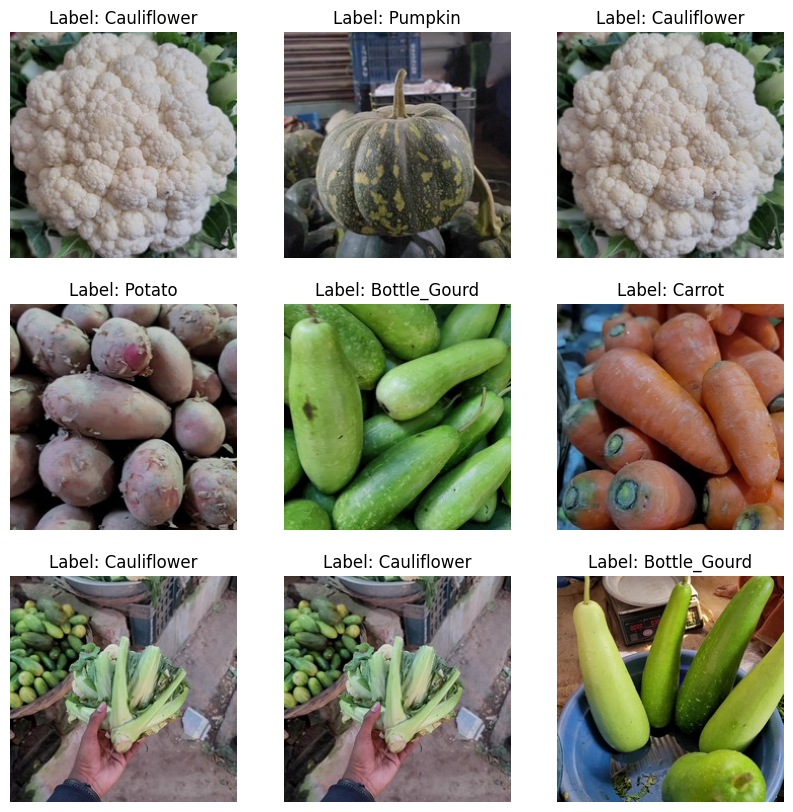

In [15]:
show_dataset_samples(train_set)

## Compute standardization parameters and apply

In [16]:
def get_mean_and_std(dataloader):
    channels_sum, channels_squared_sum, num_batches = 0, 0, 0
    for data, _ in dataloader:
        # Mean over batch, height and width, but not over the channels
        channels_sum += torch.mean(data, dim=[0,2,3])
        channels_squared_sum += torch.mean(data**2, dim=[0,2,3])
        num_batches += 1

    mean = channels_sum / num_batches

    # std = sqrt(E[X^2] - (E[X])^2)
    std = (channels_squared_sum / num_batches - mean ** 2) ** 0.5

    return mean, std

# https://towardsdatascience.com/how-to-calculate-the-mean-and-standard-deviation-normalizing-datasets-in-pytorch-704bd7d05f4c

## Question 4: Why are we calculating the mean and std of only the trian_set in the cell below? Why not calculate for the whole dataset?

**Answer**

Here, we calculate the mean and standard deviation (**std**) of only the **train_set** because these values represent the distribution of the data that the model will learn from. During training, we want the model to see data that is normalized consistently based on the characteristics of the training data alone, as this helps improve the stability and accuracy of learning.

If we calculated the mean and **std** for the entire dataset (including validation and test sets), it could introduce information from the validation and test sets into the training process. This would cause data leakage, meaning the model could gain an unfair advantage by indirectly "seeing" part of the validation and test data during training. To avoid this, we standardize using only the training set.

In [17]:
# Create a dummy dataloader for our train_set
dataloader = torch.utils.data.DataLoader(dataset=train_set, batch_size=32)

# Call the function and compute mean and std
mean, std = get_mean_and_std(dataloader)
print(mean, std)

tensor([0.4681, 0.4648, 0.3449]) tensor([0.2338, 0.2292, 0.2433])


In [18]:
# Add the new normalization to the existing transforms
normalize = torchvision.transforms.Normalize(mean=mean, std=std)
transform = torchvision.transforms.Compose([transform, normalize])

## Question 5: How are we updating the transforms of our subsets in the cell below?

**Answer**

In following cell, we are updating the transform attribute of our **train_set**, **val_set**, and **test_set** subsets to include normalization. This ensures that all images across these subsets are processed with the same updated transformations, including the new normalization step based on the training set's mean and standard deviation.

Following is the working of this code:

- **update_transform()** first checks if the subset directly has a **transform** attribute. If it does, it updates this attribute with the new **transform**.

- If the subset doesn't have **transform** directly, it checks if it has a **dataset** with its own **transform** attribute, updating it there instead.

- If neither condition is met, the function prints an error message.

In short, all images in the training, validation, and test sets will be preprocessed in a consistent manner, including the new normalization transform.

In [19]:
# A function for updating the transforms of our dataset objects
def update_transform(dataset, transform):
    if hasattr(dataset, 'transform'):
      dataset.transform = transform
      dataset.transform

    elif hasattr(dataset, 'dataset') and hasattr(dataset.dataset, 'transform'):
      dataset.dataset.transform = transform
      dataset.dataset.transform

    else:
      print("No transform attribute found.")

In [20]:
# Add the normalization transform to the datasets
# using the "update_transform" function
update_transform(train_set, transform)
update_transform(val_set, transform)
update_transform(test_set, transform)

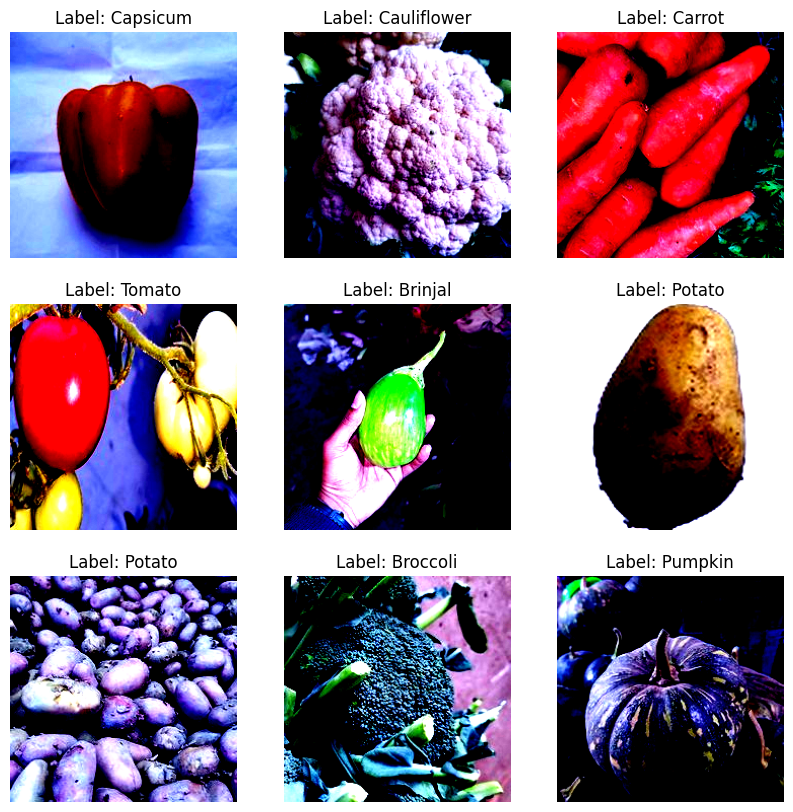

In [21]:
### Visualize the images with the new normalization transform
show_dataset_samples(train_set)

## Data Augmentation

## Question 6: What transforms are we using in the cell below?

**Answer**

In following cell, we are using a set of data augmentation transforms aimed at creating varied versions of the training images. Here’s the list of transformations:

- **torchvision.transforms.RandomHorizontalFlip()** randomly flips the image horizontally.

- **torchvision.transforms.RandomVerticalFlip()** randomly flips the image vertically.

- **torchvision.transforms.RandomRotation(degrees=45)** randomly rotates the image up to 45 degrees in either direction.

- **torchvision.transforms.GaussianBlur(5)** applies a Gaussian blur with a kernel size of 5, softening the image.

These transformations are combined with the earlier transform, which includes resizing, converting to tensor, and normalizing.

## Question 7: Why are we only applying them to the train_set?

**Answer**

We only apply these transformations to the **train_set** because they are meant to help the model generalize better by learning from various forms of each training image. This improves the model's ability to recognize patterns despite changes in orientation, position, or slight blurriness.

In contrast, we don't apply these augmentations to the **val_set** and **test_set** because these sets are used for evaluating the mode;'s performance. The goal is to keep validation and test images as close to real-world, unmodified examples as possible so we get an accurate sense of the model's ability to generalize to unseen data.

In [22]:
# composing transforms instance for data augmentation
augmentation_transforms = torchvision.transforms.Compose([transform,
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomVerticalFlip(),
    torchvision.transforms.RandomRotation(degrees=45),
    torchvision.transforms.GaussianBlur(5)
    ])

# Add the augmentation_transfomers to the train_set
update_transform(train_set, transform)

## Initializing the pytorch dataloaders and visualize train examples

In [23]:
train_loader = torch.utils.data.DataLoader(
    train_set,
    batch_size=batch_size,
    shuffle=True
)

val_loader = torch.utils.data.DataLoader(
    val_set,
    batch_size=batch_size,
    shuffle=False
)

test_loader = torch.utils.data.DataLoader(
    test_set,
    batch_size=batch_size,
    shuffle=False
)

# Convolutional Neural Networks Architectures

# TASKS
# You have two tasks to perform in this lab:

## Task 1:
In the cells below the VGG16 model has been manually implemented for you to initialize a VGG16 model with random variables. You have also been provided code for using a pretrained VGG16 model.

1. You are to first train the manually implemented model from scratch for 15 epochs, save its training and validation plots and evaluate it on the test set.

2. Then, using the provided code, fine-tune the pre-trained model for a 3 epochs, save its training and validation plots and evaluate it on the test set.  

Compare the performance and traning plots of the pre-trained model with those of the model trained from scratch. Report and discuss your observations in the Lab Report for both models.

## Task 2:
Train a pretrained ResNet-50 model on the same dataset for a few epochs 2-3 epochs, save its plots, evaluate it on the test set and compare its performance with that of the pre-trained VGG-16 model. Report and discuss your observations.



## VGG-16 Manual Implementation and Random Initialization
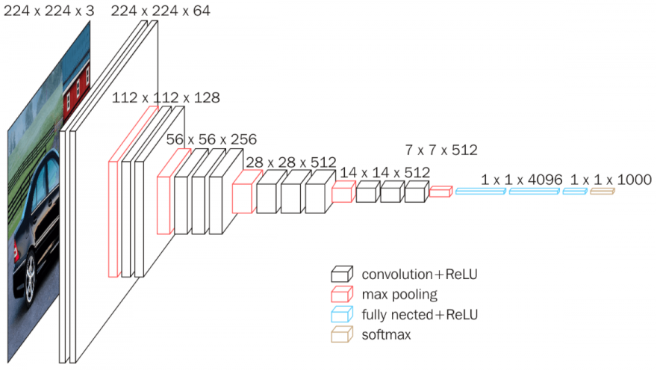

In [24]:
class VGG16(nn.Module):
    def __init__(self, num_classes=15, im_height=224, im_width=224):

        super(VGG16, self).__init__()

        max_pool_count = 5
        size_reduction_factor = 2**max_pool_count
        out_height = im_height // size_reduction_factor
        out_width = im_width // size_reduction_factor

        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU())

        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.layer3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU())

        self.layer4 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.layer5 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU())

        self.layer6 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU())

        self.layer7 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.layer8 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU())

        self.layer9 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU())

        self.layer10 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.layer11 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU())

        self.layer12 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU())

        self.layer13 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size = 2, stride = 2))

        self.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(out_height*out_width*512, 4096),
            nn.ReLU())

        self.fc1 = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU())

        self.fc2= nn.Sequential(
            nn.Linear(4096, num_classes))

    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.layer5(out)
        out = self.layer6(out)
        out = self.layer7(out)
        out = self.layer8(out)
        out = self.layer9(out)
        out = self.layer10(out)
        out = self.layer11(out)
        out = self.layer12(out)
        out = self.layer13(out)
        out = out.reshape(out.size(0), -1)
        out = self.fc(out)
        out = self.fc1(out)
        out = self.fc2(out)
        return out

# Source: https://blog.paperspace.com/vgg-from-scratch-pytorch/

## Question 8: Instead of fine-tuning the pre-trained model for a few epochs what would happen if we train the pre-trained model for a large number of epochs on the train_set?

**Answer**

If we train the pre-trained model for too many epochs on the **train_set**, it is likely to overfit. Overfitting means the model will become highly accurate on the training data but will struggle to generalize to new, unseen data, such as the validation or test sets.

When we fine-tune a pre-trained model, we leverage its existing knowledge from large datasets to achieve good performance with minimal training on our smaller dataset. Training it for too long would cause the model to “memorize” the training data specifics, reducing its ability to recognize patterns that differ slightly, which leads to poor performance on real-world data. Additionally, long training can also consume unnecessary time and computational resources without yielding better results.

In [25]:
model = VGG16()

## Loss Function and Optimizer Selection

In [26]:
# Select a loss function
loss_function = torch.nn.CrossEntropyLoss()

# Select an optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Define the learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)
# For more on schedulers please visit:
# https://towardsdatascience.com/a-visual-guide-to-learning-rate-schedulers-in-pytorch-24bbb262c863

# Set the number of epochs
# This variable is used in the main training loop
epochs = 15 # Define the Epochs

model.to(device);

# Training

## Function for running the model over all the samples of a given dataloader object

In [27]:
def run_1_epoch(model, loss_fn, loader, optimizer = None, train = False):

  if train:
    model.train()
  else:
    model.eval()


  total_correct_preds = 0

  total_loss = 0

  # Number of images we can get by the loader
  total_samples_in_loader = len(loader.dataset)

  # number of batches we can get by the loader
  total_batches_in_loader = len(loader)

  for image_batch, labels in tqdm(loader):

    # Transfer image_batch to GPU if available
    image_batch = image_batch.to(device)
    labels = labels.to(device)

    # Zeroing out the gradients for parameters
    if train:
      assert optimizer is not None, "Optimizer must be provided if train=True"
      optimizer.zero_grad()

    # Forward pass on the input batch
    output = model(image_batch)

    # Acquire predicted class indices
    _, predicted = torch.max(output.data, 1) # the dimension 1 corresponds to max along the rows

    # Removing extra last dimension from output tensor
    output.squeeze_(-1)

    # Compute the loss for the minibatch
    loss = loss_function(output, labels)

    # Backpropagation
    if train:
      loss.backward()

    # Update the parameters using the gradients
    if train:
      optimizer.step()

    # Extra variables for calculating loss and accuracy
    # count total predictions for accuracy calcutuon for this epoch
    total_correct_preds += (predicted == labels).sum().item()

    total_loss += loss.item()

  loss = total_loss / total_batches_in_loader
  accuracy = 100 * total_correct_preds / total_samples_in_loader

  return loss, accuracy

In [28]:
# Initializing variables for starting a new training
# Some helper variables

train_accuracy_list = []
val_accuracy_list = []

train_loss_list = []
val_loss_list = []


val_accuracy_max = -1

checkpoint_path = '/content/VGG16_checkpoint.pth' # Define the path
best_val_checkpoint_path = '/content/VGG16_best_val_checkpoint.pth' # Define the path

# Start epoch is zero for new training
start_epoch = 0

## Setting up Tensorboard

## Question 9: What do you observe in the cells given below related to Tensorboard? Please discuss in the report. How do you enable the tensorboard in the colab environment like this one?

**Answer**

In the provided code, TensorBoard is used to log training and validation metrics like loss and accuracy for each epoch. By using **writer.add_scalar()**, you can visualize how these metrics evolve over time.

To enable TensorBoard in a Google Colab environment, you can use the following steps:

1. Install TensorBoard (if it's not already installed): `!pip install tensorboard`
2. Load TensorBoard: `%load_ext tensorboard`
3. Start TensorBoard : You can specify the log directory where TensorBoard saves its files. For instance, `%tensorboard --logdir runs`

This will open a new interface displaying the training curves for loss and accuracy, which can be analyzed to understand model performance over time.


In [29]:
import tensorboard
from torch.utils.tensorboard import SummaryWriter

In [30]:
# A command starting with % is called a magic command
# This command is used for loading the tensorboard extension for
# enabling it to be able to run in this colab notebook
%load_ext tensorboard

# Otherwise when it is installed in your PC the tensorboard is run through the
# browser. Once it is run, you use the provided address to access it through
# a browser on your PC.

In [31]:
# Initialize the SummaryWriter instance. The default log_dir is set to runs/
# Here we have speified our own log directory
writer = SummaryWriter(log_dir="/content/VGG16_runs/")

In [32]:
sample_images, labels = next(iter(train_loader))

# The add_graph method is used to visualize the model
# We provide the model and sample image
writer.add_graph(model, sample_images.to(device))

### Note: Once the tesnorboard interface is showing and the training has been started, you may click on the referesh button to start visualizing the training curves.

In [ ]:
# The % sign is the magic command for the tensorboard to run in colab
#
%tensorboard --logdir /content/VGG16_runs/

# For more details:
# https://pytorch.org/tutorials/intermediate/tensorboard_tutorial.html

<IPython.core.display.Javascript object>

## Main training loop

## Question 10: How is modularity introduced in the over training of our model in this notebook? What does run_1_epoch() actually do in this case?   

**Answer**

Modularity is introduced in the training process through the **run_1_epoch()** function. This function encapsulates the logic required to perform a single epoch of training or validation, making the main training loop cleaner and easier to understand.

The **run_1_epoch()** function likely takes parameters like the model, loss function, data loader, optimizer, and a flag to indicate whether it's training or validating. Inside, it would typically:
- Iterate through the dataset.
- Forward pass the inputs through the model.
- Calculate the loss.
- If training, perform a backward pass and update the model parameters.

This structure allows you to reuse the code for different phases (training vs. validation) without duplicating logic, improving readability and maintainability.

## Question 11: How are we logging Tensorboard values in the cell below? Are you observing the training plots during the training of your the implemented VGG16 model?

**Answer**

The code logs TensorBoard values by calling **writer.add_scalar()** with three arguments: the tag (name of the metric), the scalar value (actual loss or accuracy), and the global step (current epoch number). This records the loss and accuracy metrics for both training and validation phases.

Yes, you can see the training plots during the training of the VGG16 model in the TensorBoard "Scalars" section. As the training progresses, you can observe the loss decreasing and accuracy increasing, which indicates that the model is learning.

## Question 12: Please discuss about the checkpointing in the cell below. How is it implemented?

**Answer**

Checkpointing is the process of saving the model's state at certain intervals during training. This is useful for resuming training or analyzing the model later.

In the provided code, checkpointing is implemented as follows:

- At the end of each epoch, the code checks if the validation accuracy has improved.

- If it has, it saves the current model’s state (weights), optimizer state, and other parameters (like learning rate and losses) into a checkpoint file.
- The checkpoint is stored in a specified path, which can be loaded later for further training or evaluation.

This mechanism ensures that you don’t lose progress if training is interrupted and allows you to revert to the best-performing model based on validation accuracy.

In [ ]:
# Main training and validation loop for n number of epochs
for epoch in range(start_epoch, epochs):

  # Train model for one epoch

  # Get the current learning rate from the optimizer
  current_lr = optimizer.param_groups[0]['lr']

  print("Epoch %d: Train \nLearning Rate: %.6f"%(epoch, current_lr))
  train_loss, train_accuracy  = run_1_epoch(model, loss_function, train_loader, optimizer, train= True)

  # Update the learning rate scheduler
  scheduler.step()

  # Lists for train loss and accuracy for plotting
  train_loss_list.append(train_loss)
  train_accuracy_list.append(train_accuracy)

  # Validate the model on validation set
  print("Epoch %d: Validation"%(epoch))
  with torch.no_grad():
    val_loss, val_accuracy  = run_1_epoch(model, loss_function, val_loader, optimizer, train= False)

  # Lists for val loss and accuracy for plotting
  val_loss_list.append(val_loss)
  val_accuracy_list.append(val_accuracy)

  # The "add_scalar" function adds a new metric to the tensorboard log
  # It is gnerally given 3 arguments:
  # tag: Name of the metric
  # scalar_value = the value of the metric to record
  # global_step = on which milestone to record the scalar value which in our
  # case is the epoch
  writer.add_scalar(tag = "Loss/train", scalar_value = train_loss, global_step = epoch)
  writer.add_scalar(tag = "accuracy/train", scalar_value = train_accuracy, global_step = epoch)

  writer.add_scalar(tag = "Loss/val", scalar_value = val_loss, global_step = epoch)
  writer.add_scalar(tag = "accuracy/val", scalar_value = val_accuracy, global_step = epoch)

  print('train loss: %.4f'%(train_loss))
  print('val loss: %.4f'%(val_loss))
  print('train_accuracy %.2f' % (train_accuracy))
  print('val_accuracy %.2f' % (val_accuracy))

  # Save model if validation accuracy for current epoch is greater than
  # all the previous epochs
  if val_accuracy > val_accuracy_max:
    val_accuracy_max = val_accuracy
    print("New max val Accuracy Acheived %.2f. Saving model.\n\n"%(val_accuracy_max))

    checkpoint = {
    'model': model.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_loss_list,
    'train_accuracies': train_accuracy_list,
    'val_losses': val_loss_list,
    'val_accuracies': val_accuracy_list,
    'val_accuracy_max': val_accuracy_max,
    'lr': optimizer.param_groups[0]['lr']
    }
    torch.save(checkpoint, best_val_checkpoint_path)

  else:
    print("val accuracy did not increase from %.2f\n\n"%(val_accuracy_max))

# Save checkpoint for the last epoch
  checkpoint = {
    'model': model.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_loss_list,
    'train_accuracies': train_accuracy_list,
    'val_losses': val_loss_list,
    'val_accuracies': val_accuracy_list,
    'val_accuracy_max': val_accuracy_max,
    'lr': optimizer.param_groups[0]['lr']
    }

  torch.save(checkpoint, checkpoint_path)
  writer.flush()


Epoch 0: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:42<00:00,  1.27s/it]


Epoch 0: Validation


100%|██████████| 8/8 [00:03<00:00,  2.49it/s]


train loss: 5.9032
val loss: 16.2109
train_accuracy 9.62
val_accuracy 4.22
New max val Accuracy Acheived 4.22. Saving model.


Epoch 1: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:40<00:00,  1.22s/it]


Epoch 1: Validation


100%|██████████| 8/8 [00:03<00:00,  2.15it/s]


train loss: 2.7196
val loss: 2.5112
train_accuracy 12.62
val_accuracy 15.78
New max val Accuracy Acheived 15.78. Saving model.


Epoch 2: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:39<00:00,  1.21s/it]


Epoch 2: Validation


100%|██████████| 8/8 [00:03<00:00,  2.53it/s]


train loss: 2.4526
val loss: 2.2325
train_accuracy 18.52
val_accuracy 20.67
New max val Accuracy Acheived 20.67. Saving model.


Epoch 3: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:40<00:00,  1.24s/it]


Epoch 3: Validation


100%|██████████| 8/8 [00:03<00:00,  2.45it/s]


train loss: 2.3016
val loss: 2.4339
train_accuracy 20.81
val_accuracy 14.44
val accuracy did not increase from 20.67


Epoch 4: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:41<00:00,  1.25s/it]


Epoch 4: Validation


100%|██████████| 8/8 [00:03<00:00,  2.53it/s]


train loss: 2.0904
val loss: 2.0231
train_accuracy 23.95
val_accuracy 28.00
New max val Accuracy Acheived 28.00. Saving model.


Epoch 5: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:40<00:00,  1.22s/it]


Epoch 5: Validation


100%|██████████| 8/8 [00:03<00:00,  2.51it/s]


train loss: 1.9909
val loss: 1.9241
train_accuracy 27.62
val_accuracy 29.11
New max val Accuracy Acheived 29.11. Saving model.


Epoch 6: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:39<00:00,  1.21s/it]


Epoch 6: Validation


100%|██████████| 8/8 [00:03<00:00,  2.51it/s]


train loss: 1.9049
val loss: 2.1543
train_accuracy 31.10
val_accuracy 21.33
val accuracy did not increase from 29.11


Epoch 7: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:40<00:00,  1.21s/it]


Epoch 7: Validation


100%|██████████| 8/8 [00:03<00:00,  2.52it/s]


train loss: 1.8231
val loss: 1.7172
train_accuracy 35.57
val_accuracy 41.33
New max val Accuracy Acheived 41.33. Saving model.


Epoch 8: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:40<00:00,  1.21s/it]


Epoch 8: Validation


100%|██████████| 8/8 [00:03<00:00,  2.51it/s]


train loss: 1.8077
val loss: 1.7466
train_accuracy 38.24
val_accuracy 38.89
val accuracy did not increase from 41.33


Epoch 9: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:40<00:00,  1.21s/it]


Epoch 9: Validation


100%|██████████| 8/8 [00:03<00:00,  2.28it/s]


train loss: 1.8006
val loss: 1.6547
train_accuracy 36.90
val_accuracy 38.67
val accuracy did not increase from 41.33


Epoch 10: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:40<00:00,  1.22s/it]


Epoch 10: Validation


100%|██████████| 8/8 [00:03<00:00,  2.50it/s]


train loss: 1.7078
val loss: 1.3895
train_accuracy 40.57
val_accuracy 55.56
New max val Accuracy Acheived 55.56. Saving model.


Epoch 11: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:39<00:00,  1.20s/it]


Epoch 11: Validation


100%|██████████| 8/8 [00:03<00:00,  2.53it/s]


train loss: 1.6825
val loss: 1.5009
train_accuracy 41.86
val_accuracy 47.11
val accuracy did not increase from 55.56


Epoch 12: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:40<00:00,  1.21s/it]


Epoch 12: Validation


100%|██████████| 8/8 [00:03<00:00,  2.50it/s]


train loss: 1.5810
val loss: 1.3307
train_accuracy 44.57
val_accuracy 48.89
val accuracy did not increase from 55.56


Epoch 13: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:39<00:00,  1.21s/it]


Epoch 13: Validation


100%|██████████| 8/8 [00:03<00:00,  2.42it/s]


train loss: 1.5444
val loss: 1.3714
train_accuracy 44.57
val_accuracy 51.78
val accuracy did not increase from 55.56


Epoch 14: Train 
Learning Rate: 0.001000


100%|██████████| 33/33 [00:40<00:00,  1.22s/it]


Epoch 14: Validation


100%|██████████| 8/8 [00:03<00:00,  2.41it/s]


train loss: 1.4960
val loss: 1.6008
train_accuracy 46.57
val_accuracy 45.56
val accuracy did not increase from 55.56




In [ ]:
# Copy best model to drive
# You may also directly save the best model to drive during training

!cp /content/VGG16_best_val_checkpoint.pth /content/drive/MyDrive

cp: cannot create regular file '/content/drive/MyDrive': No such file or directory


**Accuracy and Loss Result Graphs:**

Text(0.5, 1.0, 'Training and val Loss')

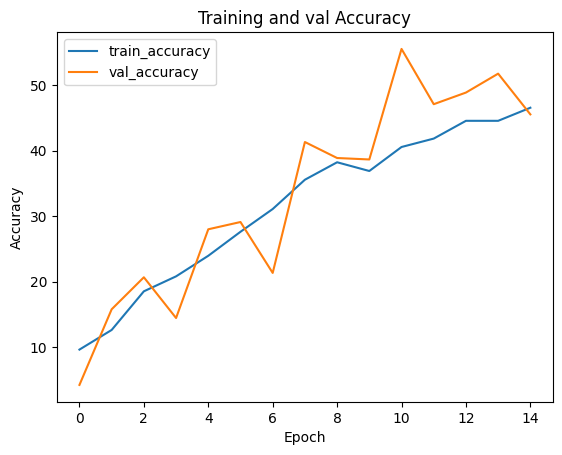

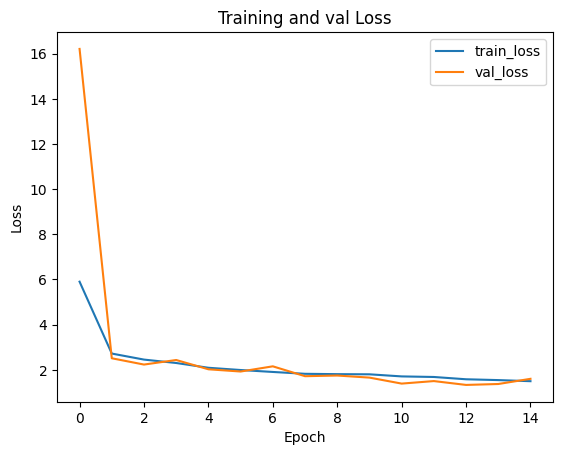

In [ ]:
plt.figure()
plt.plot(train_accuracy_list, label="train_accuracy")
plt.plot(val_accuracy_list, label="val_accuracy")
plt.legend()

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.title('Training and val Accuracy')

plt.figure()
plt.plot(train_loss_list, label="train_loss")
plt.plot(val_loss_list, label="val_loss")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and val Loss')

# Evaluating the Model

**Loading the best saved model:**

In [ ]:
best_val_model_path = '/content/VGG16_best_val_checkpoint.pth'
best_val_checkpoint = torch.load(best_val_model_path, map_location=torch.device(device))

<ipython-input-39-e5c6f6f7da65>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_val_checkpoint = torch.load(best_val_model_path, map_location=torch.device(device))


In [ ]:
# Before loading the state_dict of the model, make sure the "model" instance is
# initiated by its corresponding class e.g. VGG16
model.load_state_dict(best_val_checkpoint['model'])

<All keys matched successfully>

In [ ]:
with torch.no_grad():
    test_loss, test_accuracy  = run_1_epoch(model, loss_function, test_loader, train= False)

print('test loss: %.4f'%(test_loss))
print('test_accuracy %.2f' % (test_accuracy))


100%|██████████| 8/8 [00:03<00:00,  2.18it/s]

test loss: 1.4107
test_accuracy 55.33


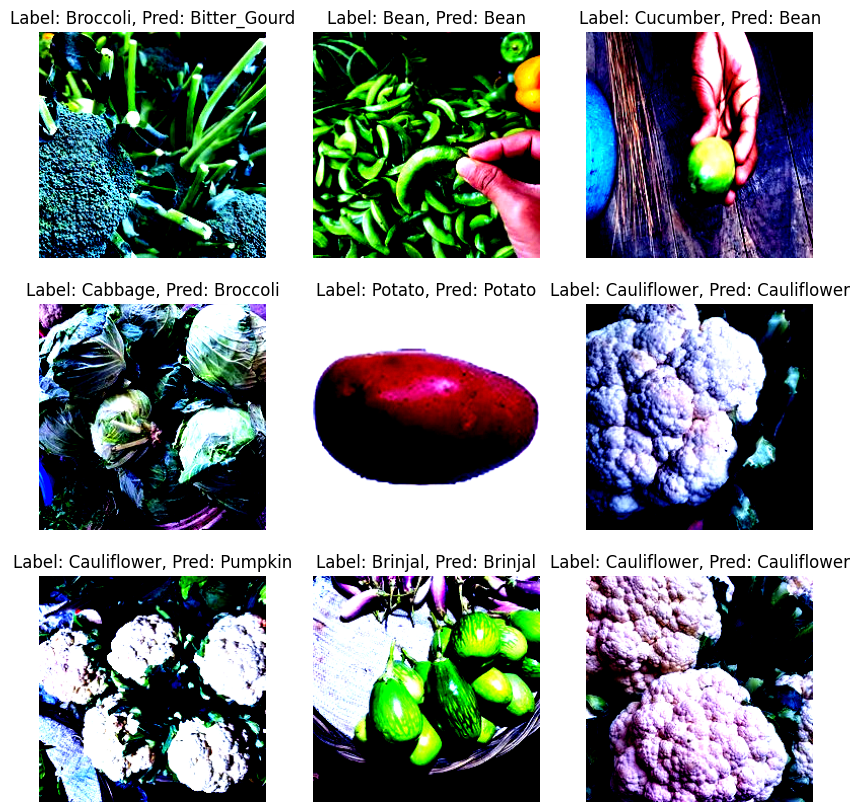

In [ ]:
# Get a batch of images from the train_loader
images, labels = next(iter(test_loader))

with torch.no_grad():
  predicted_labels = model(images.to(device))
  predicted_labels = torch.argmax(predicted_labels, 1)
rows = col = 3
#fig, axes = plt.subplots(nrows=5, ncols=5))
plt.figure(figsize = (10,10))

for i in range(rows*col):
  # Plot a random image from the batch
  random_index = np.random.randint(0, images.shape[0])
  image = images[random_index]
  label = labels[random_index]
  pred_label = predicted_labels[random_index]
  plt.subplot(rows, col, i+1)
  plt.axis('off')
  plt.imshow(image.permute(1,2,0))
  plt.title(f'Label: {classes[label]}, Pred: {classes[pred_label]}')

# TorchVision Pretrained VGG16 Model

In [33]:
# https://pytorch.org/vision/stable/models.html
pretrained_VGG16_model = torchvision.models.vgg16(pretrained= True)

# Alternate method of initialization:
# modelVGG = torchvision.models.vgg19(weights=torchvision.models.VGG19_Weights)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:07<00:00, 72.7MB/s]


The "parameters()" attribute of a model returns us a generator that iteratively provides us the parameters of each layer of the model.

In the code below, we use a for loop to iterate over the parameters of each layer in the model.

The requires_grad flag for parameters of a layer signifies whether to calculate the gradients for those parameters when doing a backward pass. So initially we set requires_grad to false for parameters of all the layers

In [34]:
for param in pretrained_VGG16_model.parameters():
    param.requires_grad = False

In [35]:
pretrained_VGG16_model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

### Replace an exisiting layer in model (VGG16)

The VGG16 model is divided into two sequential parts: First one is the "features" module and the second one is the classifer module. The "features" module consists of all the 2D opertation layers and the "classifier" module consists of all the fully connected layers.

In our case, the vegetable dataset has 15 classes, so we initialize a new layer and replace the last linear layer of the classifier that has 1000 outputs for 1000 classes of imagenet with the new layer with 15 outputs.


In [36]:
pretrained_VGG16_model.classifier[-1] = nn.Linear(in_features=4096, out_features= 15)

# Model Configuration

## Loss Function and Optimizer

In [37]:
# TO-DO

import torch.optim as optim

# Define the loss function
loss_function = nn.CrossEntropyLoss()

# Define the optimizer (using Adam in this case)
optimizer = optim.Adam(pretrained_VGG16_model.parameters(), lr=0.001)

# Training

In [38]:
# TO-DO

def run_1_epoch(model, loss_function, data_loader, optimizer, train=True):
    model.train() if train else model.eval()
    total_loss = 0.0
    correct = 0
    total = 0

    for inputs, labels in data_loader:
        if train:
            optimizer.zero_grad()

        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        total_loss += loss.item()

        if train:
            loss.backward()
            optimizer.step()

        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    avg_loss = total_loss / len(data_loader)
    accuracy = (correct / total) * 100  # Convert to percentage

    return avg_loss, accuracy

## Setting up Tensorboard

In [39]:
# TO-DO

from torch.utils.tensorboard import SummaryWriter

# Initialize TensorBoard writer
writer = SummaryWriter(log_dir='runs/vgg16_experiment')

## Main training loop

In [40]:
# TO-DO

epochs = 3
train_loss_list, train_accuracy_list = [], []
val_loss_list, val_accuracy_list = [], []

for epoch in range(epochs):
    print(f'Epoch {epoch + 1}/{epochs}')

    # Train the model
    train_loss, train_accuracy = run_1_epoch(pretrained_VGG16_model, loss_function, train_loader, optimizer, train=True)
    train_loss_list.append(train_loss)
    train_accuracy_list.append(train_accuracy)

    # Validate the model
    val_loss, val_accuracy = run_1_epoch(pretrained_VGG16_model, loss_function, val_loader, optimizer, train=False)
    val_loss_list.append(val_loss)
    val_accuracy_list.append(val_accuracy)

    # Log values to TensorBoard
    writer.add_scalar('Loss/train', train_loss, epoch)
    writer.add_scalar('Accuracy/train', train_accuracy, epoch)
    writer.add_scalar('Loss/val', val_loss, epoch)
    writer.add_scalar('Accuracy/val', val_accuracy, epoch)

    print(f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%')
    print(f'Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%\n')

Epoch 1/3
Train Loss: 0.6905, Train Accuracy: 83.33%
Val Loss: 0.1109, Val Accuracy: 98.22%

Epoch 2/3
Train Loss: 0.1159, Train Accuracy: 97.43%
Val Loss: 0.0669, Val Accuracy: 98.89%

Epoch 3/3
Train Loss: 0.0754, Train Accuracy: 98.38%
Val Loss: 0.0507, Val Accuracy: 99.33%



**Accuracy and Loss Result Graphs:**

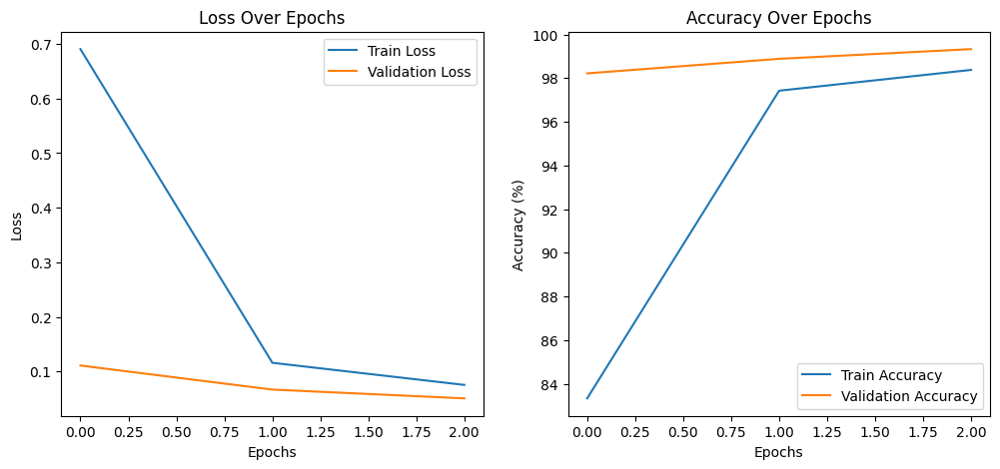

In [41]:
# TO-DO

import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label='Train Loss')
plt.plot(val_loss_list, label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracy_list, label='Train Accuracy')
plt.plot(val_accuracy_list, label='Validation Accuracy')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.show()

# Evaluating the Model

In [42]:
# TO-DO

def evaluate_model(model, data_loader):
    model.eval()
    total_correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in data_loader:
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            total_correct += (predicted == labels).sum().item()

    accuracy = (total_correct / total) * 100
    print(f'Evaluation Accuracy: {accuracy:.2f}%')

# Evaluate the model on the validation set
evaluate_model(pretrained_VGG16_model, val_loader)

Evaluation Accuracy: 99.33%


# TorchVision Pretrained ResNet-50 Model

In [43]:
# TO DO (For Instructions, Please Refer to the Task 2)

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

# Load the pretrained ResNet-50 model
pretrained_resnet50_model = torchvision.models.resnet50(pretrained=True)

# Freeze the parameters of the pretrained model
for param in pretrained_resnet50_model.parameters():
    param.requires_grad = False

# Replace the final fully connected layer to match the number of classes in the dataset
num_classes = 15
pretrained_resnet50_model.fc = nn.Linear(in_features=2048, out_features=num_classes)

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(pretrained_resnet50_model.fc.parameters(), lr=0.001)

# Load dataset and create data loaders
transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor()])

train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, transform=transform, download=True)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pretrained_resnet50_model.to(device)

# Training loop for 3 epochs
num_epochs = 3
for epoch in range(num_epochs):
    pretrained_resnet50_model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = pretrained_resnet50_model(images)
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}")


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 152MB/s]


100%|██████████| 170M/170M [00:05<00:00, 28.6MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Epoch [1/3], Loss: 0.7645
Epoch [2/3], Loss: 0.6306
Epoch [3/3], Loss: 0.6065


**Submission**

**Its an individual lab.**
**Please submit notebook and answers to the questions with proper analysis.**

### Useful repositories for gradcam and visualizations.
https://github.com/jacobgil/pytorch-grad-cam

https://github.com/utkuozbulak/pytorch-cnn-visualizations


# Notebook Source
https://github.com/Vision-At-SEECS/Pytorch_Labs/blob/main/Lab3_Transfer_Learning_and_GradCAM.ipynb

You may explore other notebooks in the link of the repository given above.



# Conclusion

In this lab, I used transfer learning with pre-trained VGG16 and ResNet50 models to classify images, experimenting with training and evaluation to optimize accuracy and performance.

1. **VGG16 Results**: The VGG16 model performed extremely well, achieving `high accuracy (99.33%)` on the validation set by the end of the third epoch. However, the training time was noticeably long, which is due to VGG16's deep architecture and large number of parameters. This highlights that while VGG16 can achieve high accuracy, it may not be the best choice for time-sensitive tasks due to the computational load.

2. **ResNet50 Results**: The ResNet50 model's training was faster compared to VGG16, likely due to its residual structure, which is designed to optimize training efficiency while maintaining accuracy. Although the loss decreased with each epoch, it appears that ResNet50 did not converge as quickly as VGG16 in these three epochs. Given more epochs, it would likely catch up in performance.

**Key Learnings**:

- **Transfer Learning Benefits**: Both VGG16 and ResNet50 models, pre-trained on ImageNet, provided a strong starting point for image classification on our dataset, allowing faster convergence and higher accuracy with limited training.

- **Model Selection**: VGG16 achieves high accuracy but with a trade-off in speed, whereas ResNet50's architecture allows faster training, though it may require more epochs to reach optimal accuracy. This exercise showed how model choice depends on balancing accuracy with computational resources and time constraints.

- **TensorBoard Monitoring**: Throughout training, TensorBoard was used to visualize the training progress and identify areas for potential optimization, such as adjusting the learning rate or monitoring overfitting.

- **Checkpointing**: Saving model checkpoints allowed us to retain the best model performance throughout training, helping ensure the highest validation accuracy is preserved without requiring retraining from scratch if interrupted.

Overall, this lab demonstrates the effectiveness of transfer learning with large models on complex image classification tasks and emphasizes the importance of balancing model complexity with available resources.



---

